Import relevant libraries

In [1]:
import os
import numpy as np
import pandas as pd
from PIL import Image
from IPython.display import display
import matplotlib.pyplot as plt
import matplotlib as mpl
from pathlib import Path
import pickle as pkl
import shutil
import yaml
from pprint import pprint
import blobfile as bf
import torch as th

import cg_diffusion.filename_utils as filename_utils
import cg_diffusion.image_datasets as image_datasets
from cg_diffusion.script_util import list_subset

%load_ext autoreload
%autoreload 2

/home/liz0f/anaconda3/envs/His/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


set mpl parameters

In [2]:
COLOR = 'black'
mpl.rcParams['text.color'] = COLOR
mpl.rcParams['axes.labelcolor'] = COLOR
mpl.rcParams['axes.edgecolor'] = COLOR
mpl.rcParams['xtick.color'] = COLOR
mpl.rcParams['ytick.color'] = COLOR
mpl.rcParams['figure.dpi'] = 300
mpl.rcParams['pdf.fonttype'] = 'truetype'

set REPO_DIR to the root directory of this repo

In [3]:
REPO_DIR=os.path.dirname(os.getcwd())

# Define Helper Functions

In [4]:
# This helper loads the relevant genes used in genomics and transcriptomics-guided editing
def load_omics_tables():
    omics_tables_dir=os.path.join(REPO_DIR,"download/inference/demo_data/TCGA-general")
    genomics_table_fp=os.path.join(omics_tables_dir,"genomics_table.csv")
    transcriptomics_table_fp=os.path.join(omics_tables_dir,"transcriptomics_table.csv")
    transcriptomics_annotation_fp=os.path.join(omics_tables_dir,"transcriptomics_genes_anno.csv")

    omics_spec=dict(
        genomics_table=pd.read_csv(genomics_table_fp,index_col=0),
        transcriptomics_table=pd.read_csv(transcriptomics_table_fp,index_col=0),
        transcriptomics_anno_table=pd.read_csv(transcriptomics_annotation_fp,index_col=0)

    )
    return omics_spec

# This helper visualizes images in grids
def show(imgs, titles=None, ncols=3):
    if not isinstance(imgs, list):
        imgs = [imgs]
    nrows = (len(imgs) + ncols - 1)//ncols
    width=ncols*3
    height=nrows*3
    fig, axes = plt.subplots(nrows = nrows, ncols=ncols, figsize=(width,height), squeeze=False)
    plt.tight_layout(pad=0)
    axes = axes.flatten()
    
    for i, img in enumerate(imgs):
        if isinstance(img,th.Tensor):
            img = np.asarray(F.to_pil_image(img.detach()))
        elif isinstance(img, Image.Image):
            img = np.asarray(img)
        elif isinstance(img,str):
            img = np.asarray(Image.open(img))
        axes[i].imshow(np.asarray(img))
        axes[i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
        if titles is not None:
            axes[i].set_title(titles[i])
            
    for i in range(len(imgs),len(axes)):
        axes[i].set_visible(False)

# This function saves the specifications of image translation to disk, either as yaml or pickle file
def save_modifications(modification_dict,logdir,fmt="yaml"):
    os.makedirs(logdir,exist_ok=True)
    if fmt=="yaml":
        with open(os.path.join(logdir,"modification.yaml"),'w') as f: 
            yaml.dump({
                "fn_list":list(modification_dict.keys()),
                "modifications":{
                    "custom":modification_dict
                }
            },f,default_flow_style=True)
    elif fmt=='pkl':
        with open(os.path.join(logdir,"modification.pkl"),'wb') as f: 
            pkl.dump({
                "fn_list":list(modification_dict.keys()),
                "modifications":{
                    "custom":modification_dict
                }
            },f)
            
# This function loads the specifications of image translation from disk
def load_modifications(logdir,fmt="yaml"):
    if fmt=="yaml":
        with open(os.path.join(logdir,"modification.yaml"),'r') as f:
            modification_dict=yaml.safe_load(f)
    elif fmt=='pkl':
        with open(os.path.join(logdir,"modification.pkl"),'rb') as f:
            modification_dict=pkl.load(f)
    return modification_dict["modifications"]["custom"]

# This function gets the names of the translated and un-translated images
def get_img_filenames(fn, labels, logdir):
    img_filenames=[f"{Path(fn).stem}.processed{Path(fn).suffix}"]
    img_filepaths=[os.path.join(logdir, "translation", img_filenames[-1])]
    
    for i in range(len(labels)):
        img_filenames.append(f"{Path(fn).stem}__sample_{labels[i]}{Path(fn).suffix}")
        img_filepaths.append(os.path.join(logdir, "translation", img_filenames[-1]))
        
    return img_filenames,img_filepaths

# This function runs the actual translation step through shell
def run_translation(mode, data_dir, logdir, modification_dict, save=True, run=False, delete=False, load=False):
    if delete and os.path.isdir(logdir):
        shutil.rmtree(logdir)
    
    if run or save:
        os.makedirs(logdir,exist_ok=True)    
        save_modifications(modification_dict,logdir,fmt="pkl")
        
    if run:
        retval=os.system(f'cd "{REPO_DIR}"; bash "{REPO_DIR}/scripts/run-general_image_translation.sh" {mode} {data_dir} {logdir}')
        if retval!=0:
            raise ValueError("run unsuccessful")
            
    if run or load:
        vis_dict=dict()
        if os.path.isfile(os.path.join(logdir,"modification.pkl")):
            modification_dict = load_modifications(logdir,fmt="pkl")
        elif os.path.isfile(os.path.join(logdir,"modification.yaml")):
            modification_dict = load_modifications(logdir,fmt="yaml")
        else:
            assert False
        for img_fn,mod_d in modification_dict.items():
            _,img_filepaths=get_img_filenames(img_fn,mod_d["labels"],logdir)
            img_list=[fp for fp in img_filepaths]
            img_labels=["original"]+mod_d["labels"]

            vis_dict[img_fn]={
                "img_list":img_list,
                "img_labels":img_labels
            }
        return vis_dict

# TCGA primary tumor type translation

To perform image translation, we need to provide a *specification* for the model about how we would like to translate the source images.

The below provides such an example to translate histopathological image into different primary tumor types.

An example specification looks like this
```{python}
{
    'TCGA-COAD__source_image_01.png': {
    'contents': {'y': ['TCGA-BRCA','TCGA-LUAD']},
    'labels': ['BRCA','LUAD']
}
```
The `contents` specifies that, for the image named `TCGA-COAD__source_image_01.png`, we would like to translate its categorical type, specified by the variable `y`, to `TCGA-BRCA` and `TCGA-LUAD`. The names of the two translation tasks will be called `BRCA` and `LUAD`, respectively, which will later appear in the file names of the translated images. The length of the list of the specified translation `['TCGA-BRCA','TCGA-LUAD']` must be the same as the labels `['BRCA','LUAD']`.

Here is a real example to translate the images under `download/inference/demo_data/TCGA-primary_sites` into different TCGA primary tumor types. The specification is stored in `custom_modifications`

In [5]:
def get_modification_across_cancer_types(fn,all_slide_classes):
    return {
        "contents":{"y":all_slide_classes},
        "labels":all_slide_classes
    }

data_dir=os.path.join(REPO_DIR,"download/inference/demo_data/TCGA-primary_sites")
fn_list=os.listdir(data_dir)

translation_classes=[
    "TCGA-BLCA","TCGA-BRCA","TCGA-COAD","TCGA-UCEC",
    "TCGA-STAD","TCGA-HNSC","TCGA-LIHC","TCGA-LUAD",
    "TCGA-OV","TCGA-PAAD","TCGA-PRAD","TCGA-KICH",
    "TCGA-SARC","TCGA-THCA"
]

custom_modifications={
    fn:get_modification_across_cancer_types(fn,translation_classes)
    for fn in fn_list
}



The results of the translation should be saved to a directory as specified by `logdir` below. The function `run_translation` calls the script `scripts/run-general_image_translation.sh` via the command line. 

`scripts/run-general_image_translation.sh` take three arguments:
```{bash}
bash scripts/run-general_image_translation.sh <config_name> <source_image_dir> <log_dir>
```
The `<config_name>` specifies the configurations used for the model, which are defined by the shell scripts under `scripts/dataset_specific_configurations/`.

The `<source_image_dir>` specifies the source images used for this task.

The `<log_dir>` specifies the location to store the translated images and the logs during the execution.

If necessary, you need to modify this script to make sure that it runs successfully on its own on your platform.

In [9]:
logdir=os.path.join(REPO_DIR,"checkpoints/TCGA-primary_sites")

# specification saved to disk and execution of the translation
vis_dict=run_translation(
    mode="TCGA",
    data_dir=data_dir,
    logdir=logdir,
    modification_dict=custom_modifications,
    save=True,
    run=True,
    delete=True,
    load=True
)

After the translation is done, we visualize the translated images as below.

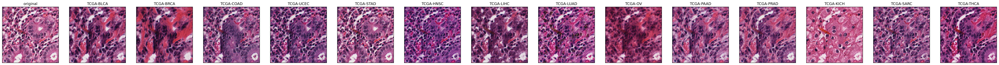

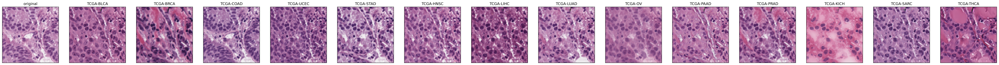

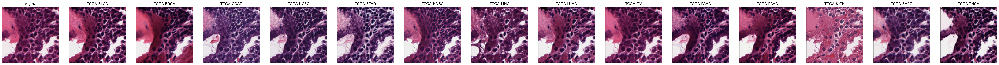

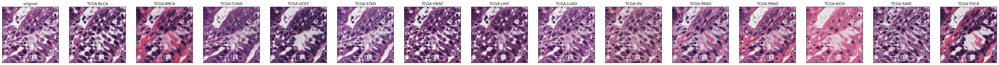

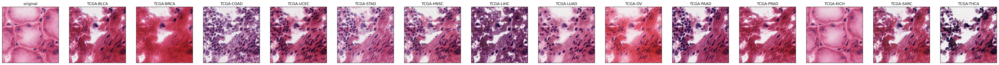

In [23]:
labels_to_visualize=["original"]+translation_classes
for fn in fn_list:
    indices=[vis_dict[fn]["img_labels"].index(label) for label in labels_to_visualize]
    img_list=[vis_dict[fn]["img_list"][i] for i in indices]
    img_labels=[vis_dict[fn]["img_labels"][i] for i in indices]
    show(img_list,img_labels,ncols=len(labels_to_visualize))
plt.show()
plt.close("all")

# TCGA genomics-guided editing

To perform genomics-guided editing of histopathological images, we need to specify genomic mutations in the specification. The following shows an example of specifying genomic mutations.

```{python}
{
    "TCGA-COAD__source_image_02.png":{
        'contents':{
            'genomics_mutation':{
                'APC': [0, 1, 0, 1, None],
                'TP53': [0, 0, 1, 1, 1]
            }
        },
        'labels':['none','APC_only','TP53_only','APC_and_TP53','APC_unmodified_and_TP53']
    }
}
```
This specification produces five versions of `TCGA-COAD__source_image_02.png` when:
1. both APC and TP53 are WT
2. APC is mutated and TP53 is WT
3. APC is WT and TP53 is mutated
4. both APC and TP53 are mutated
5. APC's mutation status is kept as it is (unmodified) in the original TCGA sample (specified by None), and TP53 is mutated

Each of the five versions is given a label which is specified through the `labels` field. The length of the lists under the keys `APC`, `TP53`, and `labels` must be exactly the same.

The following demonstrates through a real example

In [50]:
def get_genomic_single_modification(genes):
    modified_genomics_profile=dict()
    for i,g in enumerate(genes):
        modified_genomics_profile[g]=[0]+[0]*len(genes)+[1]
        modified_genomics_profile[g][i+1]=1
    modification_labels=["none",*genes,"all"]
    return {
        "contents":{
            "genomics_mutation":modified_genomics_profile
        },
        "labels":modification_labels
    }

data_dir=os.path.join(REPO_DIR,"download/inference/demo_data/TCGA-genomics")
fn_list=os.listdir(data_dir)

genes=["APC","TP53","SMAD4","DCHS2","NF1"]

custom_modifications={
    fn:get_genomic_single_modification(genes)
    for fn in fn_list
}

logdir=os.path.join(REPO_DIR,"checkpoints/TCGA-genomics")

# specification saved to disk and execution of the translation
vis_dict=run_translation(
    mode="TCGA",
    data_dir=data_dir,
    logdir=logdir,
    modification_dict=custom_modifications,
    save=False,
    run=False,
    delete=False,
    load=True
)

Visualize the translated images

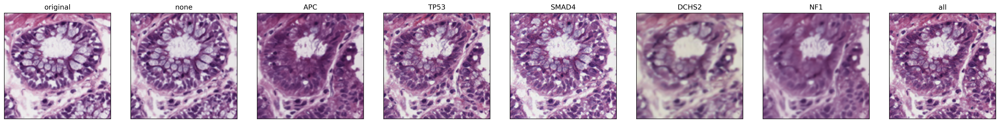

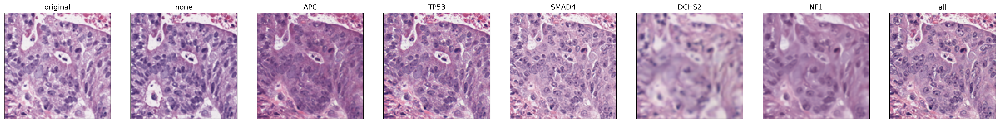

In [29]:
labels_to_visualize=["original"]+["none",*genes,"all"]
for fn in fn_list:
    indices=[vis_dict[fn]["img_labels"].index(label) for label in labels_to_visualize]
    img_list=[vis_dict[fn]["img_list"][i] for i in indices]
    img_labels=[vis_dict[fn]["img_labels"][i] for i in indices]
    show(img_list,img_labels,ncols=len(labels_to_visualize))
plt.show()
plt.close("all")

# TCGA transcriptomics-guided editing

To perform transcriptomics-guided editing of histopathological images, we need to specify transcriptomic manipulations in the specification. The following shows an example of specifying such manipulations:

```{python}
{
    "TCGA-COAD__source_image_03.png":{
        'contents':{
            'transcriptomics_exp':{
                'gene1_from_pathway1': [1, 0, None, None],
                'gene2_from_pathway1': [1, 0, None, None],
                'gene3_from_pathway1': [1, 0, None, None],
                'gene1_from_pathway2', [None, None, 1, 0],
                'gene2_from_pathway2', [None, None, 1, 0]
            }
        },
        'labels':['pathway1_1','pathway1_0','pathway2_1','pathway2_0']
    }
}
```
For the image named `TCGA-COAD__source_image_03.png`, four version are produced from it:
1. the 3 genes from pathway1 are knocked up (set to value 1)
2. the 3 genes from pathway1 are knocked down (set to value 0)
3. the 2 genes from pathway2 are knocked up (set to value 1)
4. the 2 genes from pathway2 are knocked down (set to value 0)

Each version is given a name through the `labels` field: `['pathway1_1','pathway1_0','pathway2_1','pathway2_0']`  (`1` represents knock-up and `0` represents knock-down). When one pathway is being manipulated, the expression levels of the other pathway are un-touched, specified as `None` to their component genes.

The following shows a real example for transcriptomics-guided image editing. The list of the genes of the three MSigDB pathways (`HALLMARK_MYC_TARGETS_V1`,`HALLMARK_MITOTIC_SPINDLE`, and `HALLMARK_MTORC1_SIGNALING`) are stored in `transcriptomics_genes_by_pathways`.

In [53]:
def get_transcriptomic_pathway_genes(
    omics_spec,
    transcriptomics_pathways
):
    transcriptomics_anno_table=omics_spec["transcriptomics_anno_table"].sort_values(["MSigDB"],ascending=[True])
    transcriptomics_genes_by_pathways=dict(
        transcriptomics_anno_table\
        .query("MSigDB in @transcriptomics_pathways")\
        .groupby("MSigDB")\
        .apply(lambda group: list(group.index))
    )
    return transcriptomics_genes_by_pathways

def get_modification_transcriptomics_pathways(
    fn,omics_spec,
    transcriptomics_genes_by_pathways
):
    fn_dict=filename_utils.parse_patch_filename(fn)
    
    slide_id=fn_dict["slide_id"]
    project_id=fn_dict["slide_class"]
    project_id=fn_dict["slide_class"]
    sample_id_no_vial=slide_id[:15]
    transcriptomics_table=omics_spec["transcriptomics_table"]
    
    transcriptomics_pathways=sorted(transcriptomics_genes_by_pathways.keys())
    all_pathway_genes=sum(transcriptomics_genes_by_pathways.values(),start=list())
    
    modified_transcriptomics_profile={k:[] for k in all_pathway_genes}

    modification_labels=[]

    for pathway in transcriptomics_pathways:
        pathway_genes=list(transcriptomics_genes_by_pathways[pathway])
        transcriptomics_genes_idx=[
            transcriptomics_table.index.get_loc(i) for i in pathway_genes
        ]
        for gene in pathway_genes:
            modified_transcriptomics_profile[gene].append(1)
            modified_transcriptomics_profile[gene].append(0)
        for gene in set(all_pathway_genes)-set(pathway_genes):
            modified_transcriptomics_profile[gene].append(None)
            modified_transcriptomics_profile[gene].append(None)
        modification_labels.append("%s_%d"%(pathway,0))
        modification_labels.append("%s_%d"%(pathway,1))

    return {
        "contents":{
            "transcriptomics_exp":modified_transcriptomics_profile
        },
        "labels":modification_labels
    }

omics_spec=load_omics_tables()
transcriptomics_pathways=["HALLMARK_MYC_TARGETS_V1","HALLMARK_MITOTIC_SPINDLE","HALLMARK_MTORC1_SIGNALING"]
transcriptomics_genes_by_pathways = get_transcriptomic_pathway_genes(omics_spec,transcriptomics_pathways)

data_dir=os.path.join(REPO_DIR,"download/inference/demo_data/TCGA-transcriptomics")
fn_list=os.listdir(data_dir)

custom_modifications={
    fn:get_modification_transcriptomics_pathways(fn,omics_spec,transcriptomics_genes_by_pathways)
    for fn in fn_list
}

logdir=os.path.join(REPO_DIR,"checkpoints/TCGA-transcriptomics")

# specification saved to disk and execution of the translation
vis_dict=run_translation(
    mode="TCGA",
    data_dir=data_dir,
    logdir=logdir,
    modification_dict=custom_modifications,
    save=False,
    run=False,
    delete=False,
    load=True
)

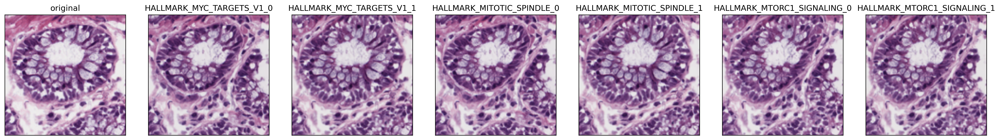

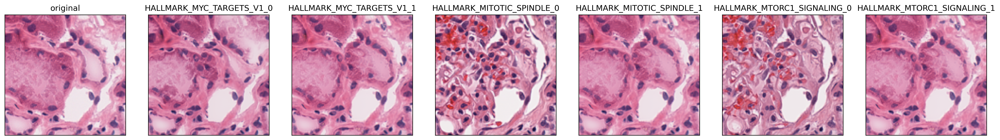

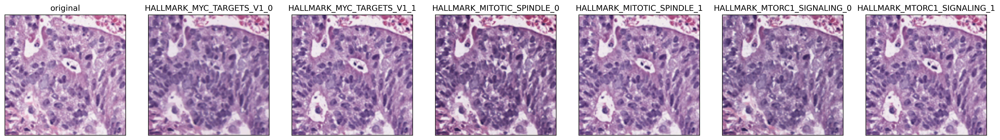

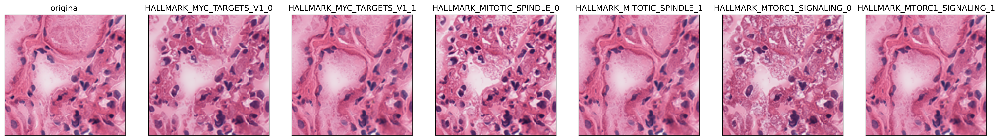

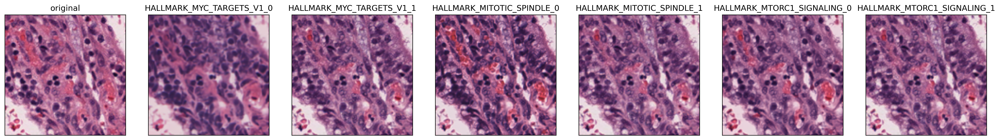

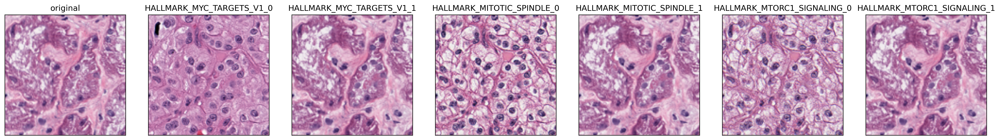

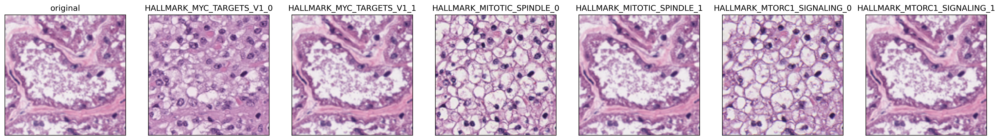

In [45]:
labels_to_visualize=["original"]
for pw in transcriptomics_pathways:
    labels_to_visualize.extend([pw+"_0",pw+"_1"])
    
for fn in fn_list:
    indices=[vis_dict[fn]["img_labels"].index(label) for label in labels_to_visualize]
    img_list=[vis_dict[fn]["img_list"][i] for i in indices]
    img_labels=[vis_dict[fn]["img_labels"][i] for i in indices]
    show(img_list,img_labels,ncols=len(labels_to_visualize))
    
plt.show()
plt.close("all")

# IHC Virtual Staining

IHC Virtual Staining is similar to the categorical domain translation between TCGA primary tumor types. Specifications are defined similarly.

In [19]:
def get_modification_across_IHC(fn,all_slide_classes):
    return {
        "contents":{"y":all_slide_classes},
        "labels":all_slide_classes
    }

data_dir=os.path.join(REPO_DIR,"download/inference/demo_data/IHC_virtual_staining")
fn_list=os.listdir(data_dir)

glioma_markers=["ATRX","IDH-1","MGMT","Oligo-2","GFAP"]
meningioma_markers=["CK","PR","SSTR2","EMA"]
common_markers=["Ki67","P53","Vimentin"]

all_markers=glioma_markers+meningioma_markers+common_markers
custom_modifications={
    fn:get_modification_across_IHC(fn,all_markers)
    for fn in fn_list
}

In [20]:
logdir=os.path.join(REPO_DIR,"checkpoints/HMU1st-virtual_staining")
vis_dict=run_translation(
    mode="IHC_virtual_staining",
    data_dir=data_dir,
    logdir=logdir,
    modification_dict=custom_modifications,
    save=False,
    run=False,
    delete=False,
    load=True
)

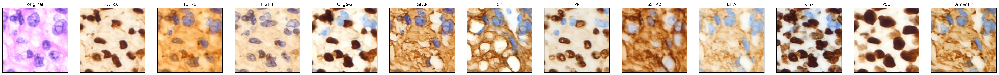

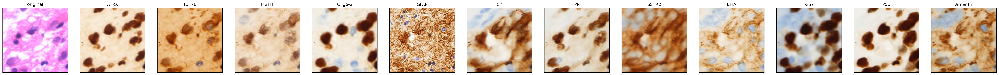

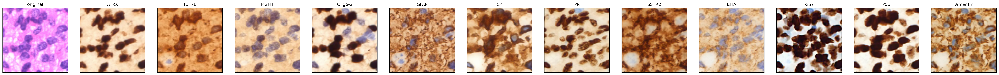

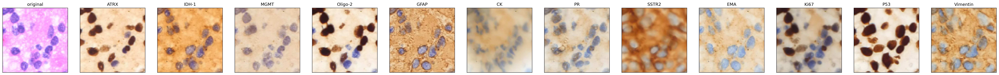

In [21]:
IHC_markers_to_visualize=["original"]+all_markers
for fn in fn_list:
    indices=[vis_dict[fn]["img_labels"].index(label) for label in IHC_markers_to_visualize]
    img_list=[vis_dict[fn]["img_list"][i] for i in indices]
    img_labels=[vis_dict[fn]["img_labels"][i] for i in indices]
    show(img_list,img_labels,ncols=len(IHC_markers_to_visualize)+1)
plt.show()
plt.close("all")